In [1]:
import pandas as pd
import math
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import librosa
import librosa.display
import soundfile as sf
import sklearn
import glob
import os
import IPython.display as ipd

# Read & Process Dataset
- Extract emotions from the file name
- Extract duration from the audio files
- Remove/Trim Noise from audio files

In [2]:
#Dictionary containing emotions present in the  dataset
emotions={
  '01':'neutral',
  '02':'calm',
  '03':'happy',
  '04':'sad',
  '05':'angry',
  '06':'fearful',
  '07':'disgust',
  '08':'surprised'
}

In [3]:
# Browse all the directories and find out the file name and extract emotions and total duration of the data
cwd = os.getcwd()

data = []
for file in glob.glob(cwd+'\data\*\*.wav'):
    file_name = os.path.basename(file)
    f = sf.SoundFile(file)
    duration = len(f)/f.samplerate
    label = file_name.split('-')[0]
    emotion = emotions[file_name.split('-')[0]]
    data.append([file,file_name,emotion,label, duration])
final_df = pd.DataFrame(data, columns=['Path','File Name', 'Emotion', 'Label','Duration'])
    
print("Total no. of audio files:", final_df.shape[0])
print("Total duration of all the audio files:", str(round(sum(final_df['Duration'])/3600,2)) +' hr')
final_df.head()

Total no. of audio files: 1440
Total duration of all the audio files: 1.48 hr


,Path,File Name,Emotion,Label,Duration
0,C:\Users\Deepanshu Goyal\OneDrive - McKinsey &...,01-01-01-01-01.wav,neutral,01,3.303292
1,C:\Users\Deepanshu Goyal\OneDrive - McKinsey &...,01-01-01-02-01.wav,neutral,01,3.336667
2,C:\Users\Deepanshu Goyal\OneDrive - McKinsey &...,01-01-02-01-01.wav,neutral,01,3.269917
3,C:\Users\Deepanshu Goyal\OneDrive - McKinsey &...,01-01-02-02-01.wav,neutral,01,3.169833
4,C:\Users\Deepanshu Goyal\OneDrive - McKinsey &...,02-01-01-01-01.wav,calm,02,3.536854


In [4]:
# Let's trim the data and remove noise which is less than 20db
trimmed_audio = []
trimmed_duration = []
for file_path in final_df['Path']:
    x, sr = librosa.load(file_path)
    x_trimmed,index = librosa.effects.trim(x,top_db=20,frame_length=2048,hop_length=512)
    duration = librosa.get_duration(x_trimmed)
    trimmed_duration.append(duration)
    trimmed_audio.append(x_trimmed)
len(trimmed_audio)

1440

In [5]:
# total duration of the audio file after trimming the noise
print("Total Duration of trimmed audio:", str(np.sum(trimmed_duration)/3600) + "hr")

Total Duration of trimmed audio: 0.6819199798437894hr


In [6]:
# Update the data frame with trimmed audio data and duration
final_df['trimmed_audio'] = trimmed_audio
final_df['trimmed_duration'] = trimmed_duration
final_df.head()

,Path,File Name,Emotion,Label,Duration,trimmed_audio,trimmed_duration
0,C:\Users\Deepanshu Goyal\OneDrive - McKinsey &...,01-01-01-01-01.wav,neutral,01,3.303292,"[-0.00088884553, -0.00023200405, -0.0001712093...",1.230658
1,C:\Users\Deepanshu Goyal\OneDrive - McKinsey &...,01-01-01-02-01.wav,neutral,01,3.336667,"[-0.0008369353, -0.00030376232, 0.0014929438, ...",1.253878
2,C:\Users\Deepanshu Goyal\OneDrive - McKinsey &...,01-01-02-01-01.wav,neutral,01,3.269917,"[-6.0881415e-05, -6.8351386e-05, -4.6439898e-0...",1.230658
3,C:\Users\Deepanshu Goyal\OneDrive - McKinsey &...,01-01-02-02-01.wav,neutral,01,3.169833,"[3.2355201e-06, -1.2257939e-05, -4.542856e-06,...",1.184218
4,C:\Users\Deepanshu Goyal\OneDrive - McKinsey &...,02-01-01-01-01.wav,calm,02,3.536854,"[-0.001611733, -0.0015423492, 8.386109e-05, 0....",1.439637


# Exploratory Data Analysis

,Emotion,Count
0,angry,192
1,calm,192
2,disgust,192
3,fearful,192
4,happy,192
5,neutral,96
6,sad,192
7,surprised,192


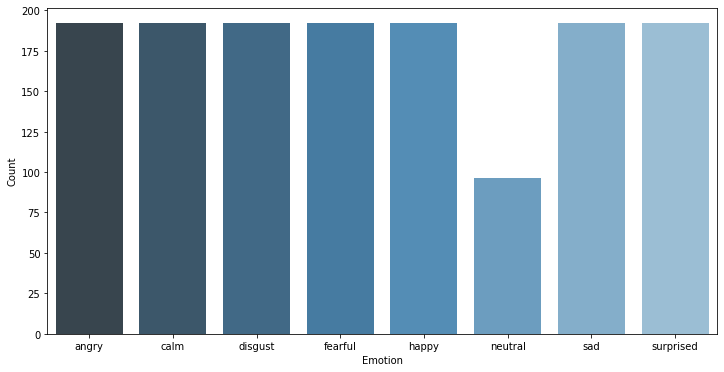

In [7]:
# Let's find out the distribution of the emotions in the audio files
emotion_count = pd.DataFrame(final_df.groupby('Emotion').count()['File Name']).\
                rename(columns={'File Name': 'Count'}).reset_index()
plt.figure(figsize=(12,6))
sns.barplot(x='Emotion', y = 'Count', data=emotion_count, palette='Blues_d')
emotion_count

0    345.396825
1    349.731973
2    373.024354
3    303.833107
4    315.434512
5    144.985397
6    336.313923
7    286.191837
Name: Seconds, dtype: float64

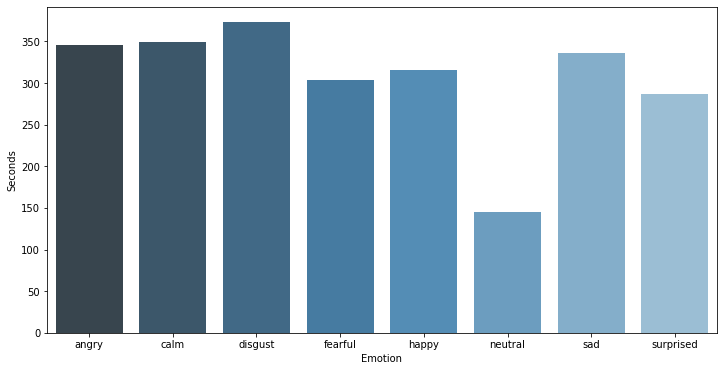

In [8]:
# Let's see how many seconds of data we have for each emotions

emotion_sec = pd.DataFrame(final_df.groupby('Emotion').sum()['trimmed_duration']).\
                rename(columns={'trimmed_duration': 'Seconds'}).reset_index()
plt.figure(figsize=(12,6))
sns.barplot(x='Emotion', y = 'Seconds', data=emotion_sec, palette='Blues_d')
emotion_sec['Seconds']

In [9]:
# Lets listen to the audio of different emotions
observed_files = []
for emotion in emotions.values():
    audio = final_df[final_df['Emotion']==emotion]['trimmed_audio'].reset_index().iloc[0]['trimmed_audio']
    path = final_df[final_df['Emotion']==emotion]['Path'].reset_index().iloc[0]['Path']
    observed_files.append([audio, path, emotion])
ipd.Audio(observed_files[0][1])

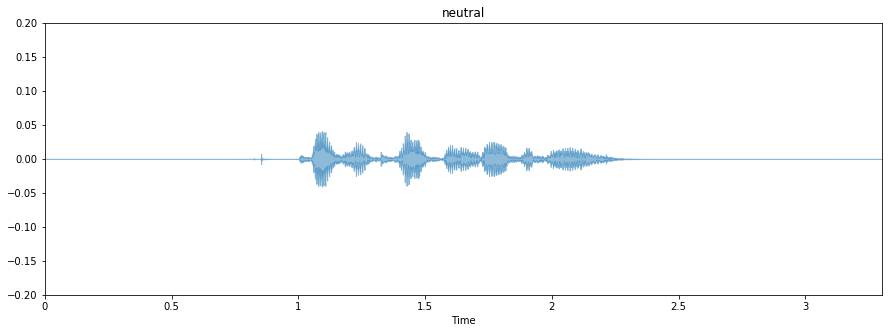

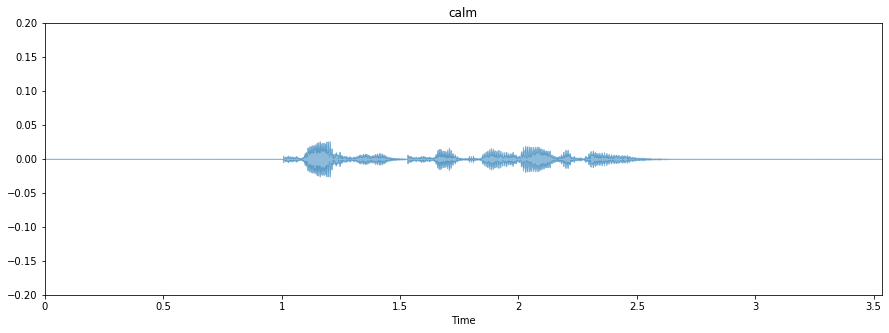

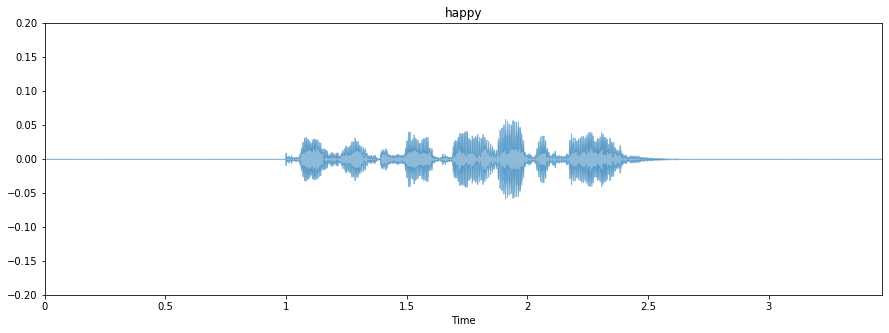

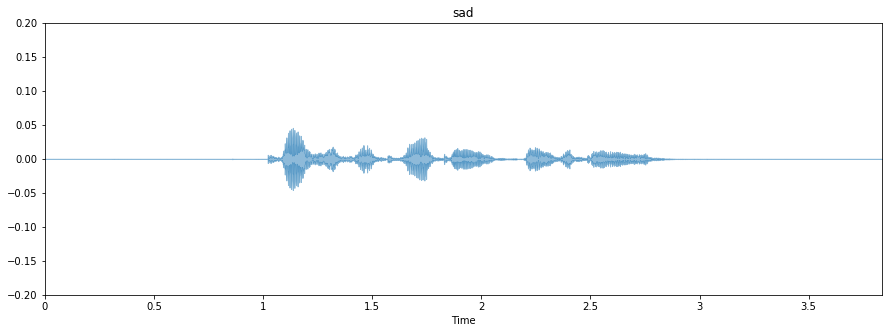

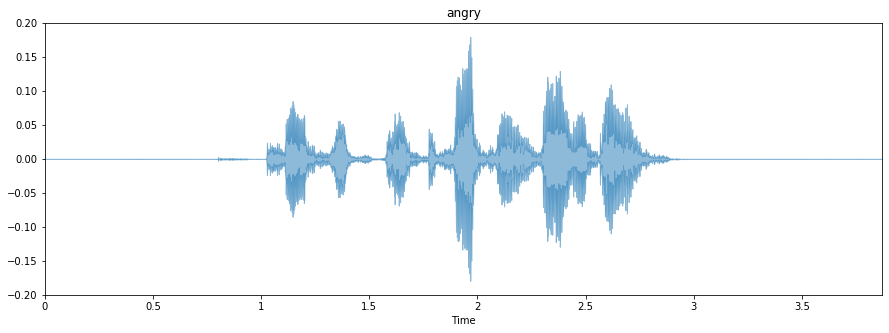

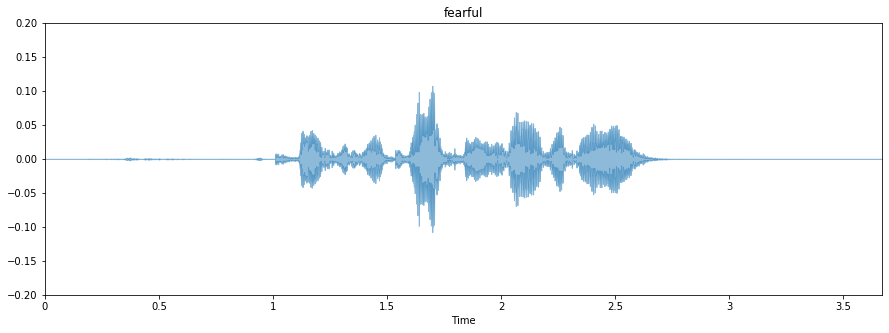

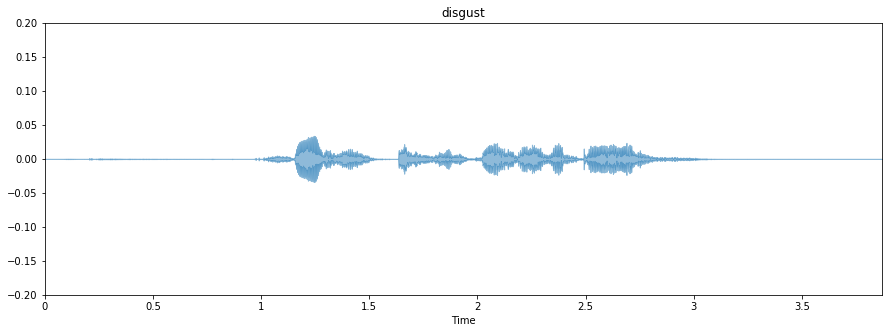

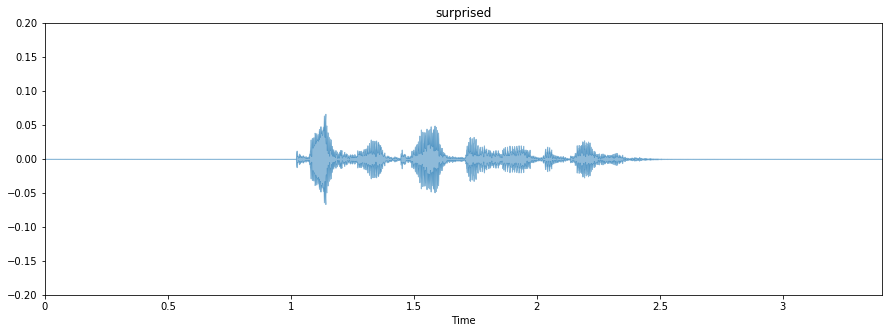

In [10]:
# Lets plot waveform of different emotions and try to visualize any differences
for audio,path, emotion in observed_files:
    x,sr = librosa.load(path)
    plt.figure(figsize=(15,5))
    librosa.display.waveplot(x,alpha=0.5)
    plt.title(emotion)
    plt.ylim((-0.2,0.2))

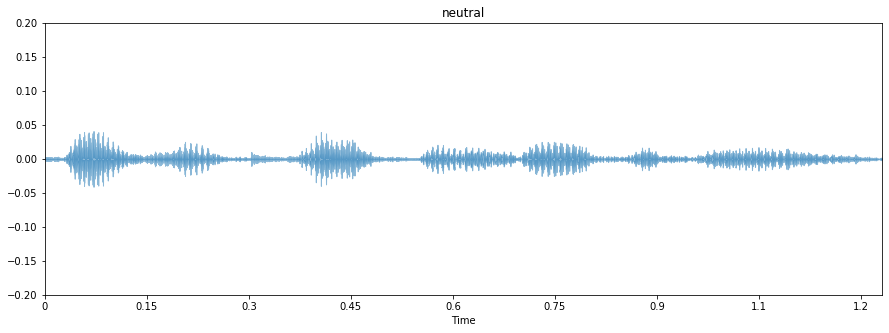

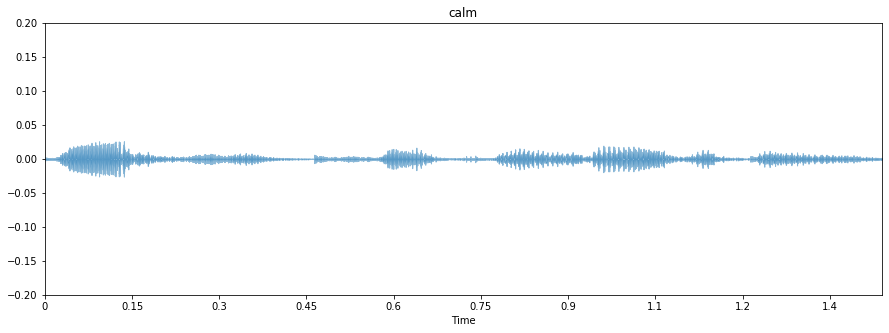

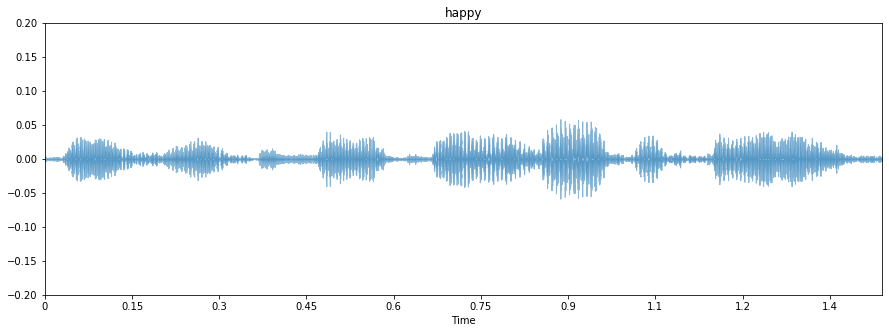

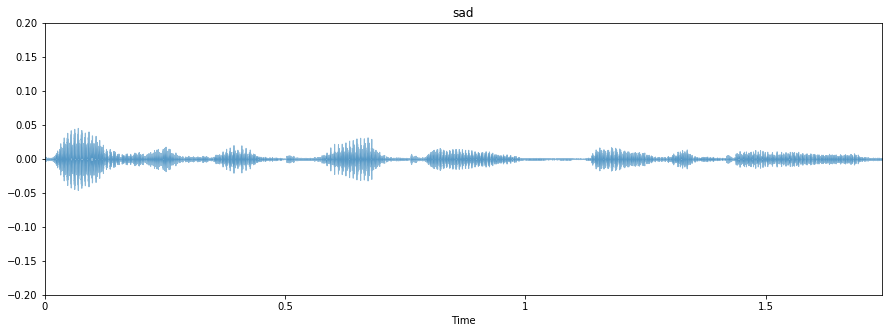

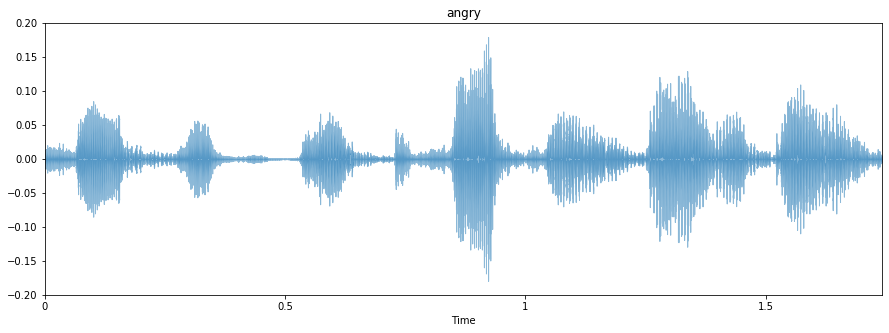

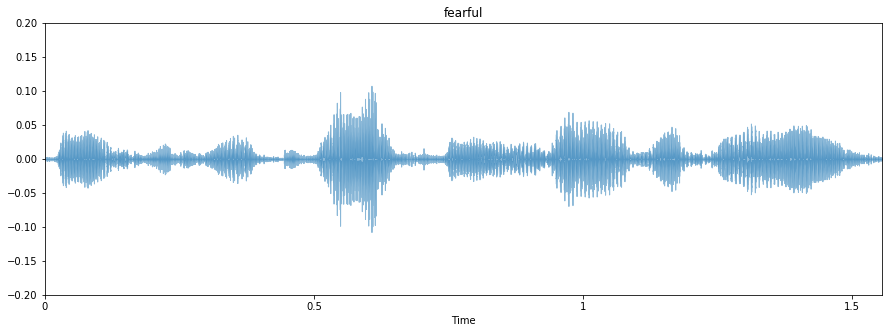

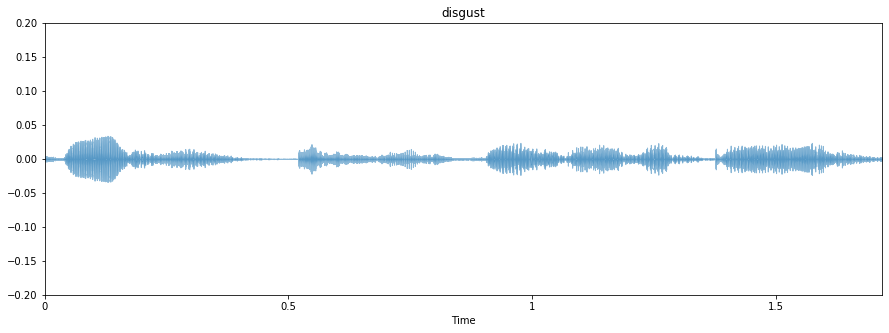

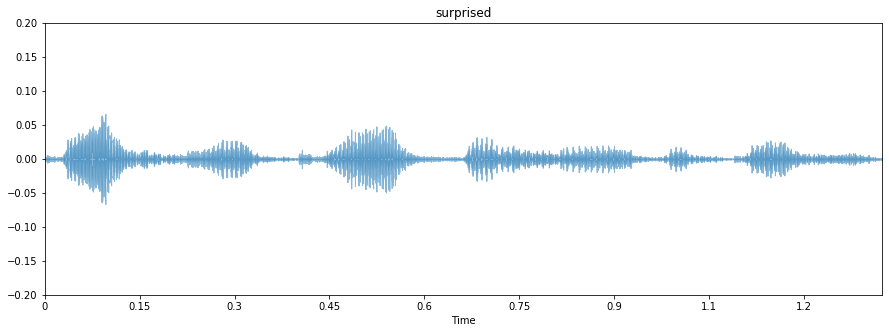

In [11]:
# Lets plot waveform of trimmed audio file with different emotions and try to visualize any differences
for audio,path, emotion in observed_files:
#    x,sr = librosa.load(file_path)
    plt.figure(figsize=(15,5))
    librosa.display.waveplot(audio,alpha=0.5)
    plt.title(emotion)
    plt.ylim((-0.2,0.2))

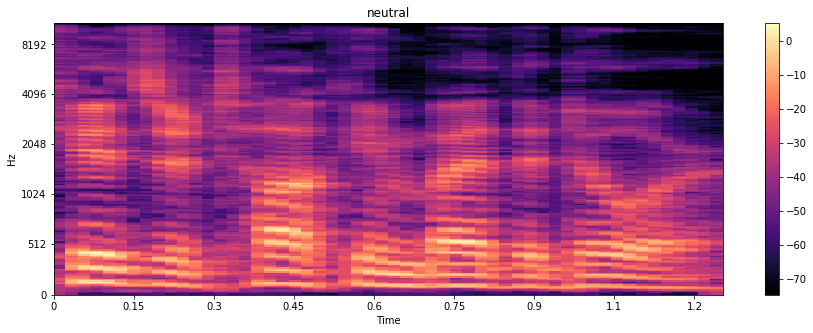

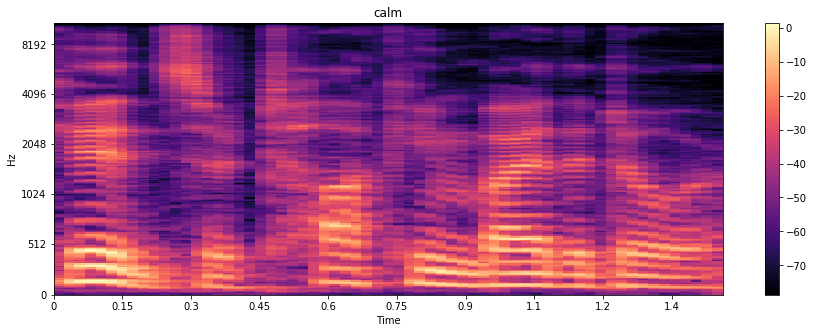

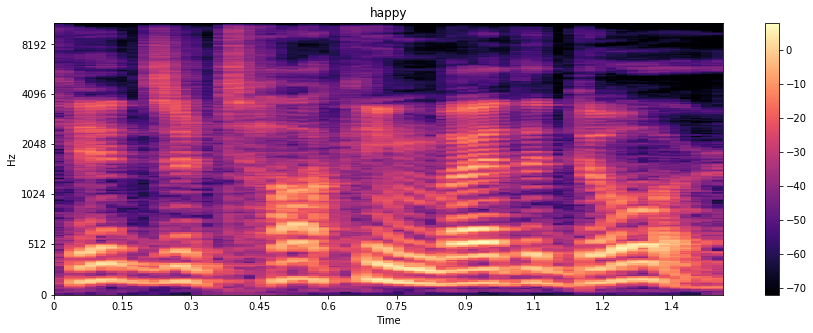

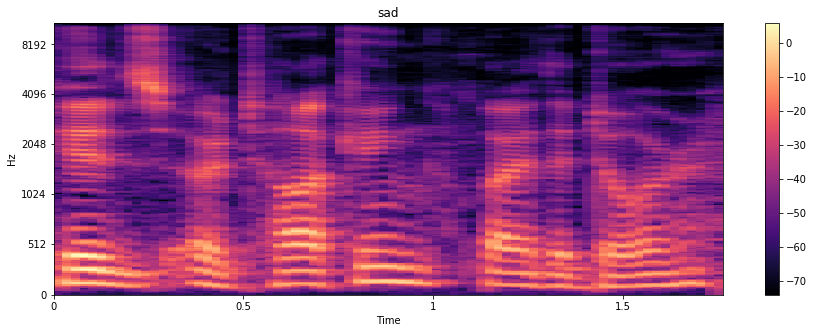

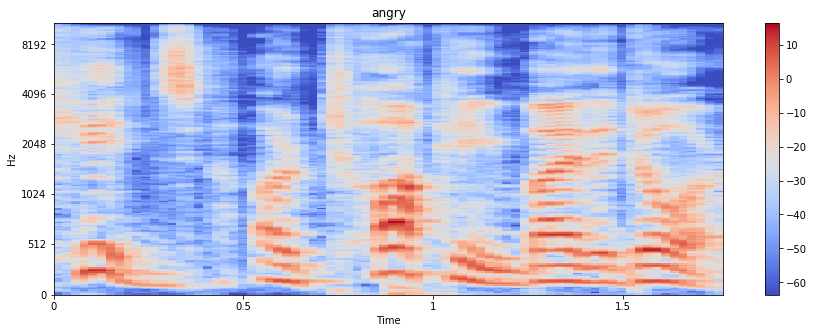

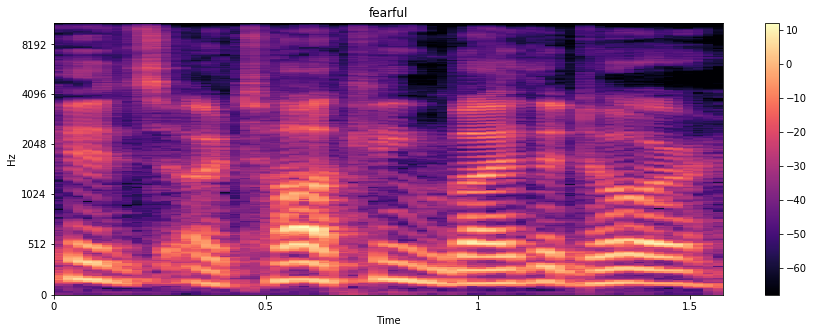

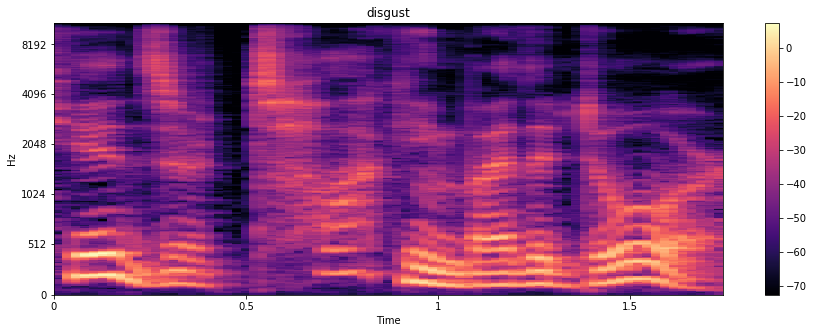

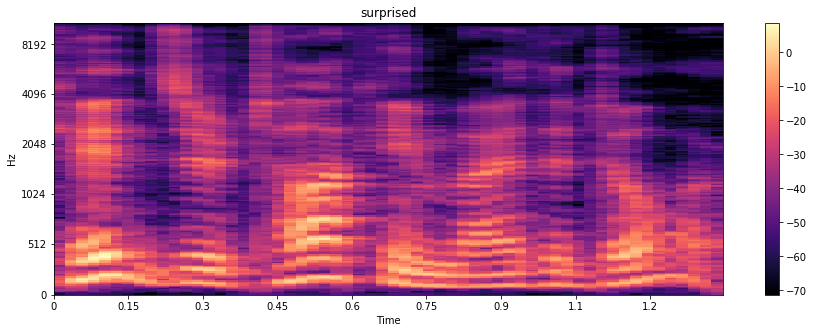

In [12]:
# Let's plot spectograms of different emotions and try to visualize the differences
for audio, path, emotion in observed_files:
#    x,sr = librosa.load(file_path)
    Xdb = librosa.power_to_db(librosa.feature.melspectrogram(audio, n_mels=256))
    plt.figure(figsize=(15,5))
    librosa.display.specshow(Xdb, x_axis='time',y_axis='mel')
    plt.title(emotion)
    plt.colorbar()   

# Exploring Time Domain Features 
- Root Mean Square (RMS) Energy 
- Zero Crossing Rate (ZCR)

In [13]:
# Lets calculate & Compare avergae RMS Energy for different emotions
# Reason for taking mean is varying audio length/frames
rms = []
for audio in final_df['trimmed_audio']:
    rms.append(np.mean(librosa.feature.rms(audio, frame_length=2048,hop_length=512)))
final_df['RMS'] = rms
final_df.groupby('Emotion').mean()['RMS'].sort_values(ascending=False)

Emotion
angry        0.055075
fearful      0.035712
happy        0.027128
surprised    0.019458
disgust      0.012517
sad          0.010528
neutral      0.007223
calm         0.005482
Name: RMS, dtype: float64

In [14]:
# Lets calculate & Compare average ZCR for different emotions
# Reason for taking mean is varying audio length/frames
zcr = []
for audio in final_df['trimmed_audio']:
    zcr.append(np.mean(librosa.feature.zero_crossing_rate(audio, frame_length=2048,hop_length=512)))
final_df['ZCR'] = zcr
final_df.groupby('Emotion').mean()['ZCR'].sort_values(ascending=False)

Emotion
angry        0.138542
disgust      0.137187
fearful      0.125682
surprised    0.118444
sad          0.114570
happy        0.113915
calm         0.108088
neutral      0.098019
Name: ZCR, dtype: float64

In [15]:
final_df.head()

,Path,File Name,Emotion,Label,Duration,trimmed_audio,trimmed_duration,RMS,ZCR
0,C:\Users\Deepanshu Goyal\OneDrive - McKinsey &...,01-01-01-01-01.wav,neutral,01,3.303292,"[-0.00088884553, -0.00023200405, -0.0001712093...",1.230658,0.005915,0.075069
1,C:\Users\Deepanshu Goyal\OneDrive - McKinsey &...,01-01-01-02-01.wav,neutral,01,3.336667,"[-0.0008369353, -0.00030376232, 0.0014929438, ...",1.253878,0.006285,0.069602
2,C:\Users\Deepanshu Goyal\OneDrive - McKinsey &...,01-01-02-01-01.wav,neutral,01,3.269917,"[-6.0881415e-05, -6.8351386e-05, -4.6439898e-0...",1.230658,0.007298,0.089202
3,C:\Users\Deepanshu Goyal\OneDrive - McKinsey &...,01-01-02-02-01.wav,neutral,01,3.169833,"[3.2355201e-06, -1.2257939e-05, -4.542856e-06,...",1.184218,0.006873,0.094060
4,C:\Users\Deepanshu Goyal\OneDrive - McKinsey &...,02-01-01-01-01.wav,calm,02,3.536854,"[-0.001611733, -0.0015423492, 8.386109e-05, 0....",1.439637,0.003946,0.087364


# Extract Time Frequency (Spectogram) Features
- melspectogram - Spectrogram with frequecy is Mel Scale (perceived frequency)
- chroma_stft - calculates the pitch class profile of an audio signal along 12 pitch classes 
- Spectral Centroid - weighted mean of frequencies at each frame of an audio signal. Capture brightness of the sound
- Band Energy Ratio - ratio of lower frequency vs high frequency in each frame of audio signal. Gives an idea whether energy is present in the lower fequency or higher frequencies
- Bandwidth - weighted mean of the distances of frequency bands from Spectral Centroid. Generally coorelated with Spectral Centroid. 

In [16]:
# Function to calculate MelSpectrogram features for each trimmed audio signal
def mel_calculate(files, n=10):
    mel=[]
    mel_cols = []
    #create columns
    for i in range(1,n+1):
        mel_cols.append("MEL"+str(i))
        
    # Extract MFCC features and create a data frame    
    for audio in files:
        mel.append(np.mean(librosa.feature.melspectrogram(audio,n_mels=n),axis=1))
    
    df = pd.DataFrame(mel, columns=mel_cols)
    return(df)

In [17]:
# Add Mel spectogram features to existing data frame
df = mel_calculate(final_df['trimmed_audio'], 512)
mel_cols = df.columns
final_df  = pd.concat([final_df,df],axis=1)
final_df

,Path,File Name,Emotion,Label,Duration,trimmed_audio,trimmed_duration,RMS,ZCR,MEL1,...,MEL503,MEL504,MEL505,MEL506,MEL507,MEL508,MEL509,MEL510,MEL511,MEL512
0,C:\Users\Deepanshu Goyal\OneDrive - McKinsey &...,01-01-01-01-01.wav,neutral,01,3.303292,"[-0.00088884553, -0.00023200405, -0.0001712093...",1.230658,0.005915,0.075069,6.415215e-06,...,0.000005,0.000004,0.000003,0.000001,4.501940e-07,1.420039e-07,5.290088e-08,2.126258e-08,1.096956e-08,4.840607e-09
1,C:\Users\Deepanshu Goyal\OneDrive - McKinsey &...,01-01-01-02-01.wav,neutral,01,3.336667,"[-0.0008369353, -0.00030376232, 0.0014929438, ...",1.253878,0.006285,0.069602,1.232250e-06,...,0.000008,0.000008,0.000004,0.000002,8.107061e-07,3.261304e-07,7.346603e-08,1.761999e-08,5.593566e-09,5.966494e-10
2,C:\Users\Deepanshu Goyal\OneDrive - McKinsey &...,01-01-02-01-01.wav,neutral,01,3.269917,"[-6.0881415e-05, -6.8351386e-05, -4.6439898e-0...",1.230658,0.007298,0.089202,3.679503e-06,...,0.000028,0.000022,0.000018,0.000007,4.394081e-06,1.279307e-06,5.698013e-07,9.786942e-08,1.558829e-08,1.650371e-09
3,C:\Users\Deepanshu Goyal\OneDrive - McKinsey &...,01-01-02-02-01.wav,neutral,01,3.169833,"[3.2355201e-06, -1.2257939e-05, -4.542856e-06,...",1.184218,0.006873,0.094060,9.135266e-06,...,0.000033,0.000036,0.000024,0.000011,3.641636e-06,1.084413e-06,4.008922e-07,1.786025e-07,2.987081e-08,6.429299e-09
4,C:\Users\Deepanshu Goyal\OneDrive - McKinsey &...,02-01-01-01-01.wav,calm,02,3.536854,"[-0.001611733, -0.0015423492, 8.386109e-05, 0....",1.439637,0.003946,0.087364,1.747973e-06,...,0.000003,0.000002,0.000003,0.000002,2.313811e-07,9.654040e-08,4.007052e-08,7.673187e-09,1.425581e-09,6.450095e-10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1435,C:\Users\Deepanshu Goyal\OneDrive - McKinsey &...,08-01-02-02-24.wav,surprised,08,3.403396,"[4.745942e-05, 8.1710685e-05, 6.829563e-05, 7....",1.393197,0.018274,0.144387,3.584617e-07,...,0.000148,0.000110,0.000067,0.000063,2.633077e-05,8.231475e-06,4.253381e-06,1.149536e-06,1.843247e-07,3.303232e-08
1436,C:\Users\Deepanshu Goyal\OneDrive - McKinsey &...,08-02-01-01-24.wav,surprised,08,3.937271,"[-0.0070703956, -0.006250957, -0.0024170424, -...",1.834376,0.024562,0.134302,8.338522e-05,...,0.000456,0.000399,0.000240,0.000243,9.708467e-05,2.980394e-05,1.254615e-05,3.792671e-06,3.525667e-07,7.152801e-08
1437,C:\Users\Deepanshu Goyal\OneDrive - McKinsey &...,08-02-01-02-24.wav,surprised,08,3.970625,"[2.1669819e-06, -1.2645168e-05, -4.196684e-06,...",1.880816,0.021066,0.151891,8.016537e-05,...,0.000343,0.000257,0.000108,0.000060,2.707602e-05,9.431041e-06,3.303123e-06,9.554510e-07,1.707980e-07,1.781626e-08
1438,C:\Users\Deepanshu Goyal\OneDrive - McKinsey &...,08-02-02-01-24.wav,surprised,08,3.670333,"[-5.2250405e-05, -7.417813e-05, -0.00011300229...",1.671837,0.029463,0.171922,3.788906e-03,...,0.006094,0.003923,0.002254,0.000954,4.646758e-04,1.935552e-04,8.354794e-05,2.136005e-05,4.163312e-06,5.427580e-07


In [18]:
# Function to calculate chromogram features for each trimmed audio signal
def chromogram_calculate(files):
    chromogram=[]
    chrom_cols = []
    #create columns
    for i in range(1,13):
        chrom_cols.append("CHROM"+str(i))
        
    # Extract MFCC features and create a data frame    
    for audio in files:
        chromogram.append(np.mean(librosa.feature.chroma_stft(audio),axis=1))
    
    df = pd.DataFrame(chromogram, columns=chrom_cols)
    return(df)

In [19]:
# Add chromogram features to existing data frame
df = chromogram_calculate(final_df['trimmed_audio'])
final_df  = pd.concat([final_df,df],axis=1)
final_df

,Path,File Name,Emotion,Label,Duration,trimmed_audio,trimmed_duration,RMS,ZCR,MEL1,...,CHROM3,CHROM4,CHROM5,CHROM6,CHROM7,CHROM8,CHROM9,CHROM10,CHROM11,CHROM12
0,C:\Users\Deepanshu Goyal\OneDrive - McKinsey &...,01-01-01-01-01.wav,neutral,01,3.303292,"[-0.00088884553, -0.00023200405, -0.0001712093...",1.230658,0.005915,0.075069,6.415215e-06,...,0.340127,0.323159,0.347926,0.298759,0.300942,0.375024,0.460609,0.470928,0.426528,0.359621
1,C:\Users\Deepanshu Goyal\OneDrive - McKinsey &...,01-01-01-02-01.wav,neutral,01,3.336667,"[-0.0008369353, -0.00030376232, 0.0014929438, ...",1.253878,0.006285,0.069602,1.232250e-06,...,0.372805,0.244232,0.273012,0.327653,0.218740,0.308169,0.373254,0.463948,0.466330,0.407076
2,C:\Users\Deepanshu Goyal\OneDrive - McKinsey &...,01-01-02-01-01.wav,neutral,01,3.269917,"[-6.0881415e-05, -6.8351386e-05, -4.6439898e-0...",1.230658,0.007298,0.089202,3.679503e-06,...,0.350541,0.406207,0.347252,0.217917,0.184940,0.320755,0.451130,0.448218,0.307293,0.301686
3,C:\Users\Deepanshu Goyal\OneDrive - McKinsey &...,01-01-02-02-01.wav,neutral,01,3.169833,"[3.2355201e-06, -1.2257939e-05, -4.542856e-06,...",1.184218,0.006873,0.094060,9.135266e-06,...,0.299374,0.302928,0.371251,0.373326,0.358335,0.423872,0.508328,0.414163,0.400011,0.396110
4,C:\Users\Deepanshu Goyal\OneDrive - McKinsey &...,02-01-01-01-01.wav,calm,02,3.536854,"[-0.001611733, -0.0015423492, 8.386109e-05, 0....",1.439637,0.003946,0.087364,1.747973e-06,...,0.429000,0.346457,0.298895,0.315515,0.295733,0.383833,0.438260,0.469459,0.516985,0.407335
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1435,C:\Users\Deepanshu Goyal\OneDrive - McKinsey &...,08-01-02-02-24.wav,surprised,08,3.403396,"[4.745942e-05, 8.1710685e-05, 6.829563e-05, 7....",1.393197,0.018274,0.144387,3.584617e-07,...,0.161318,0.218118,0.294501,0.263694,0.269626,0.357738,0.336840,0.319801,0.291734,0.260446
1436,C:\Users\Deepanshu Goyal\OneDrive - McKinsey &...,08-02-01-01-24.wav,surprised,08,3.937271,"[-0.0070703956, -0.006250957, -0.0024170424, -...",1.834376,0.024562,0.134302,8.338522e-05,...,0.355324,0.366589,0.283467,0.204358,0.219320,0.249248,0.262308,0.280914,0.313535,0.391755
1437,C:\Users\Deepanshu Goyal\OneDrive - McKinsey &...,08-02-01-02-24.wav,surprised,08,3.970625,"[2.1669819e-06, -1.2645168e-05, -4.196684e-06,...",1.880816,0.021066,0.151891,8.016537e-05,...,0.310136,0.304651,0.258280,0.305381,0.274206,0.227444,0.310621,0.350972,0.374804,0.426461
1438,C:\Users\Deepanshu Goyal\OneDrive - McKinsey &...,08-02-02-01-24.wav,surprised,08,3.670333,"[-5.2250405e-05, -7.417813e-05, -0.00011300229...",1.671837,0.029463,0.171922,3.788906e-03,...,0.337685,0.359325,0.455161,0.474178,0.374663,0.247927,0.261761,0.255469,0.263931,0.253319


In [20]:
# Calculate Spectral Centroid of each audio signal
spetral_centroid = []
for audio in final_df['trimmed_audio']:
    spetral_centroid.append(np.mean(librosa.feature.spectral_centroid(audio, n_fft=2048,hop_length=512)))
final_df['Spectral Centroid'] = spetral_centroid
final_df.groupby('Emotion').mean()['Spectral Centroid'].sort_values(ascending=False)

Emotion
angry        2542.327939
fearful      2464.274262
disgust      2444.607684
surprised    2329.448815
happy        2247.294312
sad          2160.584775
calm         2119.902542
neutral      1988.823158
Name: Spectral Centroid, dtype: float64

In [21]:
# Calculate band energy Ratio
def calculate_BER(files, sr=22050, split_frequency = 2000): # deafult sample rate to 22050
    
    ber=[]
    # Calculate frequency bin
    for audio in files:
        stft = librosa.stft(audio)
        frequency_range = sr/2
        frequency_bins = frequency_range/stft.shape[0]
        split_frequency_bin = math.floor(split_frequency/frequency_bins)
        
    # calculate power spectrogram
        power_spectrogram = np.abs(stft) ** 2
    
    # calculate BER value for each frame
        ber_audio=[]
        for frame in power_spectrogram.T:
            sum_low_frequencies = frame[:split_frequency_bin].sum()
            sum_high_frequencies = frame[split_frequency_bin:].sum()
            ber_audio.append(sum_low_frequencies / sum_high_frequencies)
        ber.append(np.mean(ber_audio))
    return(ber)

In [22]:
# Calculate Band Energy Ratio of each audio signal
BER = calculate_BER(final_df['trimmed_audio'])
final_df['BER'] = BER
final_df.groupby('Emotion').mean()['BER'].sort_values(ascending=False)

Emotion
fearful      7834.325739
sad          4982.314455
disgust      3291.122136
calm          546.964972
surprised     514.072444
happy         403.385728
neutral       394.473646
angry         112.711930
Name: BER, dtype: float64

In [23]:
# Calculate Spectral Centroid of each audio signal
bandwidth = []
for audio in final_df['trimmed_audio']:
    bandwidth.append(np.mean(librosa.feature.spectral_bandwidth(audio, n_fft=2048,hop_length=512)))
final_df['Bandwidth'] = bandwidth
final_df.groupby('Emotion').mean()['Bandwidth'].sort_values(ascending=False)

Emotion
fearful      2231.405016
calm         2150.161043
angry        2125.598846
surprised    2124.274541
disgust      2106.286437
sad          2073.309991
happy        2047.784299
neutral      2005.127786
Name: Bandwidth, dtype: float64

# Extract Cepstrum (Spectrum of Spectrum) Features i.e MFCC  

In [24]:
# Function to calculate MFCC features for each trimmed audio signal
def mfcc_calculate(files, n=13):
    mfcc=[]
    mfcc_cols = []
    #create columns
    for i in range(1,n+1):
        mfcc_cols.append("MFCC"+str(i))
        
    # Extract MFCC features and create a data frame    
    for audio in files:
        mfcc.append(np.mean(librosa.feature.mfcc(audio,n_mfcc=n),axis=1))
    
    df = pd.DataFrame(mfcc, columns=mfcc_cols)
    return(df)

In [25]:
# Add MFCC features to existing data frame
df = mfcc_calculate(final_df['trimmed_audio'], 40)
final_df  = pd.concat([final_df,df],axis=1)
final_df

,Path,File Name,Emotion,Label,Duration,trimmed_audio,trimmed_duration,RMS,ZCR,MEL1,...,MFCC31,MFCC32,MFCC33,MFCC34,MFCC35,MFCC36,MFCC37,MFCC38,MFCC39,MFCC40
0,C:\Users\Deepanshu Goyal\OneDrive - McKinsey &...,01-01-01-01-01.wav,neutral,01,3.303292,"[-0.00088884553, -0.00023200405, -0.0001712093...",1.230658,0.005915,0.075069,6.415215e-06,...,-5.811477,-5.330303,-6.581831,-4.257603,-8.310854,-3.909736,-2.868119,-4.387960,-8.624382,-3.201130
1,C:\Users\Deepanshu Goyal\OneDrive - McKinsey &...,01-01-01-02-01.wav,neutral,01,3.336667,"[-0.0008369353, -0.00030376232, 0.0014929438, ...",1.253878,0.006285,0.069602,1.232250e-06,...,-4.601566,-6.307533,-4.741160,-5.994021,-8.155732,-2.798510,-3.994516,-7.679595,-7.940201,-4.818583
2,C:\Users\Deepanshu Goyal\OneDrive - McKinsey &...,01-01-02-01-01.wav,neutral,01,3.269917,"[-6.0881415e-05, -6.8351386e-05, -4.6439898e-0...",1.230658,0.007298,0.089202,3.679503e-06,...,-4.954333,-4.298719,-5.797592,-4.468153,-7.213210,-4.626124,-3.202176,-6.347498,-8.259758,-4.900555
3,C:\Users\Deepanshu Goyal\OneDrive - McKinsey &...,01-01-02-02-01.wav,neutral,01,3.169833,"[3.2355201e-06, -1.2257939e-05, -4.542856e-06,...",1.184218,0.006873,0.094060,9.135266e-06,...,-7.376411,-5.184825,-6.688639,-5.467059,-7.421921,-3.132791,-2.574599,-5.475525,-7.959786,-7.482278
4,C:\Users\Deepanshu Goyal\OneDrive - McKinsey &...,02-01-01-01-01.wav,calm,02,3.536854,"[-0.001611733, -0.0015423492, 8.386109e-05, 0....",1.439637,0.003946,0.087364,1.747973e-06,...,-5.791691,-2.256829,-4.350036,-5.136356,-4.970525,-1.005847,-4.601401,-3.162811,-7.917425,-5.526691
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1435,C:\Users\Deepanshu Goyal\OneDrive - McKinsey &...,08-01-02-02-24.wav,surprised,08,3.403396,"[4.745942e-05, 8.1710685e-05, 6.829563e-05, 7....",1.393197,0.018274,0.144387,3.584617e-07,...,-4.720491,1.717524,1.101407,0.931848,-4.933758,-3.771811,-4.924929,-2.445632,-1.754698,0.114846
1436,C:\Users\Deepanshu Goyal\OneDrive - McKinsey &...,08-02-01-01-24.wav,surprised,08,3.937271,"[-0.0070703956, -0.006250957, -0.0024170424, -...",1.834376,0.024562,0.134302,8.338522e-05,...,-2.881231,-0.164680,-1.069007,0.744518,-1.818628,2.302548,-4.351157,-1.512961,-2.923728,-0.252595
1437,C:\Users\Deepanshu Goyal\OneDrive - McKinsey &...,08-02-01-02-24.wav,surprised,08,3.970625,"[2.1669819e-06, -1.2645168e-05, -4.196684e-06,...",1.880816,0.021066,0.151891,8.016537e-05,...,1.086342,2.585874,-2.348624,0.148112,-3.232974,1.315519,-2.889705,-0.917484,-2.960373,-0.706543
1438,C:\Users\Deepanshu Goyal\OneDrive - McKinsey &...,08-02-02-01-24.wav,surprised,08,3.670333,"[-5.2250405e-05, -7.417813e-05, -0.00011300229...",1.671837,0.029463,0.171922,3.788906e-03,...,-1.912396,3.085009,-3.934169,-1.030314,-4.354763,2.635399,-0.109920,1.999509,-2.819559,3.086776


# Preparing data for modelling
- Feature Selection
- Data Scaling & LDA Transformation
- Train Test Split

In [26]:
# Select Features
features = list(final_df.columns)
features.remove('Path')
features.remove('File Name')
features.remove('Emotion')
features.remove('Duration')
features.remove('trimmed_audio')
features.remove('trimmed_duration')
features.remove('Label')
print(features)
print(len(features))
data = final_df[features]
label = final_df['Label']
data

['RMS', 'ZCR', 'MEL1', 'MEL2', 'MEL3', 'MEL4', 'MEL5', 'MEL6', 'MEL7', 'MEL8', 'MEL9', 'MEL10', 'MEL11', 'MEL12', 'MEL13', 'MEL14', 'MEL15', 'MEL16', 'MEL17', 'MEL18', 'MEL19', 'MEL20', 'MEL21', 'MEL22', 'MEL23', 'MEL24', 'MEL25', 'MEL26', 'MEL27', 'MEL28', 'MEL29', 'MEL30', 'MEL31', 'MEL32', 'MEL33', 'MEL34', 'MEL35', 'MEL36', 'MEL37', 'MEL38', 'MEL39', 'MEL40', 'MEL41', 'MEL42', 'MEL43', 'MEL44', 'MEL45', 'MEL46', 'MEL47', 'MEL48', 'MEL49', 'MEL50', 'MEL51', 'MEL52', 'MEL53', 'MEL54', 'MEL55', 'MEL56', 'MEL57', 'MEL58', 'MEL59', 'MEL60', 'MEL61', 'MEL62', 'MEL63', 'MEL64', 'MEL65', 'MEL66', 'MEL67', 'MEL68', 'MEL69', 'MEL70', 'MEL71', 'MEL72', 'MEL73', 'MEL74', 'MEL75', 'MEL76', 'MEL77', 'MEL78', 'MEL79', 'MEL80', 'MEL81', 'MEL82', 'MEL83', 'MEL84', 'MEL85', 'MEL86', 'MEL87', 'MEL88', 'MEL89', 'MEL90', 'MEL91', 'MEL92', 'MEL93', 'MEL94', 'MEL95', 'MEL96', 'MEL97', 'MEL98', 'MEL99', 'MEL100', 'MEL101', 'MEL102', 'MEL103', 'MEL104', 'MEL105', 'MEL106', 'MEL107', 'MEL108', 'MEL109', 'ME

,RMS,ZCR,MEL1,MEL2,MEL3,MEL4,MEL5,MEL6,MEL7,MEL8,...,MFCC31,MFCC32,MFCC33,MFCC34,MFCC35,MFCC36,MFCC37,MFCC38,MFCC39,MFCC40
0,0.005915,0.075069,6.415215e-06,1.245019e-05,0.000015,7.606492e-06,0.000029,0.000020,0.000035,0.000143,...,-5.811477,-5.330303,-6.581831,-4.257603,-8.310854,-3.909736,-2.868119,-4.387960,-8.624382,-3.201130
1,0.006285,0.069602,1.232250e-06,2.391463e-06,0.000003,1.478205e-06,0.000009,0.000013,0.000023,0.000177,...,-4.601566,-6.307533,-4.741160,-5.994021,-8.155732,-2.798510,-3.994516,-7.679595,-7.940201,-4.818583
2,0.007298,0.089202,3.679503e-06,7.140915e-06,0.000014,7.213583e-06,0.000028,0.000027,0.000048,0.000221,...,-4.954333,-4.298719,-5.797592,-4.468153,-7.213210,-4.626124,-3.202176,-6.347498,-8.259758,-4.900555
3,0.006873,0.094060,9.135266e-06,1.772907e-05,0.000021,1.064052e-05,0.000045,0.000035,0.000061,0.000152,...,-7.376411,-5.184825,-6.688639,-5.467059,-7.421921,-3.132791,-2.574599,-5.475525,-7.959786,-7.482278
4,0.003946,0.087364,1.747973e-06,3.392340e-06,0.000004,2.345591e-06,0.000014,0.000015,0.000027,0.000149,...,-5.791691,-2.256829,-4.350036,-5.136356,-4.970525,-1.005847,-4.601401,-3.162811,-7.917425,-5.526691
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1435,0.018274,0.144387,3.584617e-07,6.956767e-07,0.000002,9.186084e-07,0.000008,0.000006,0.000011,0.000049,...,-4.720491,1.717524,1.101407,0.931848,-4.933758,-3.771811,-4.924929,-2.445632,-1.754698,0.114846
1436,0.024562,0.134302,8.338522e-05,1.618280e-04,0.000155,7.601133e-05,0.000142,0.000066,0.000118,0.000279,...,-2.881231,-0.164680,-1.069007,0.744518,-1.818628,2.302548,-4.351157,-1.512961,-2.923728,-0.252595
1437,0.021066,0.151891,8.016537e-05,1.555792e-04,0.000138,6.667962e-05,0.000084,0.000021,0.000037,0.000045,...,1.086342,2.585874,-2.348624,0.148112,-3.232974,1.315519,-2.889705,-0.917484,-2.960373,-0.706543
1438,0.029463,0.171922,3.788906e-03,7.353235e-03,0.008981,4.389575e-03,0.008024,0.001652,0.002935,0.001514,...,-1.912396,3.085009,-3.934169,-1.030314,-4.354763,2.635399,-0.109920,1.999509,-2.819559,3.086776


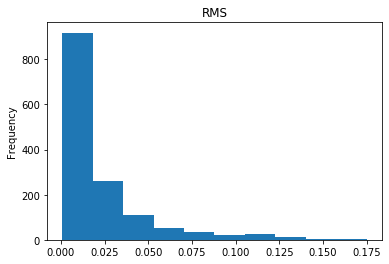

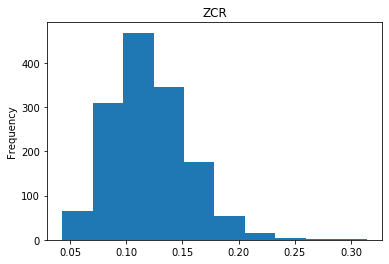

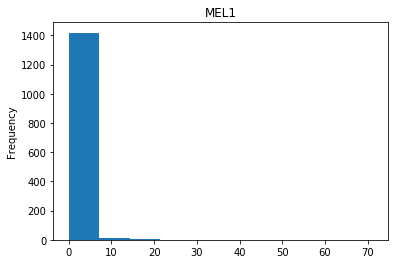

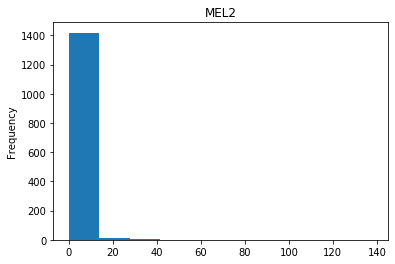

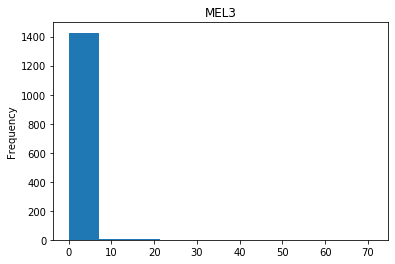

...

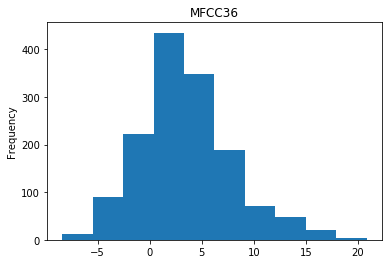

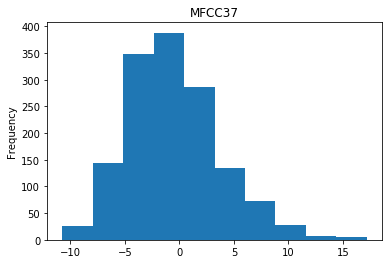

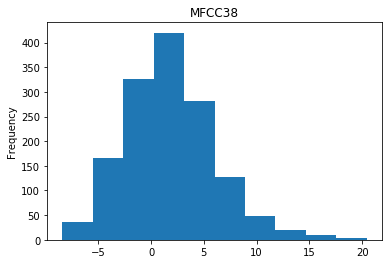

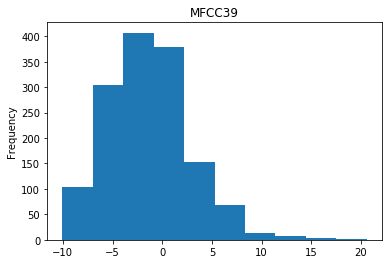

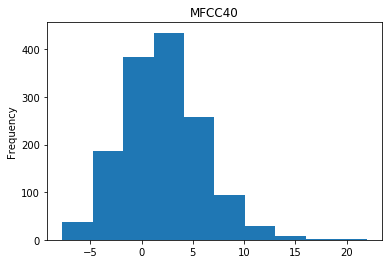

In [27]:
# Visualize histogram of each feature
for col in data:
    data[col].plot(kind='hist')
    plt.title(col)
    plt.show()

C:\Users\Deepanshu Goyal\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
C:\Users\Deepanshu Goyal\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
C:\Users\Deepanshu Goyal\AppData\Local\Continuum\anaconda3\lib\site-packages\pandas\core\frame.py:2963: SettingWithCopyWarning: 
A value is trying to be set on a copy of a sl

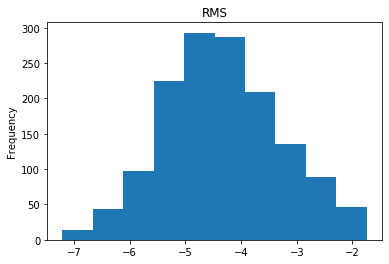

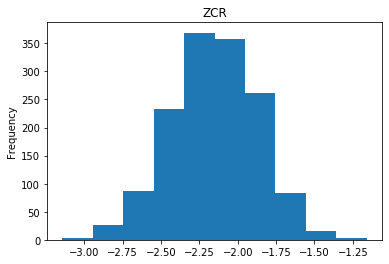

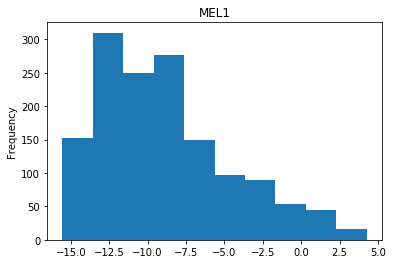

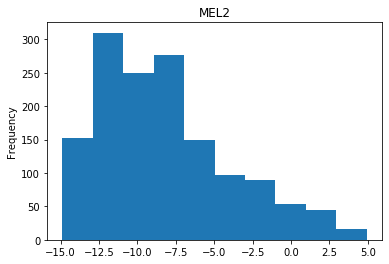

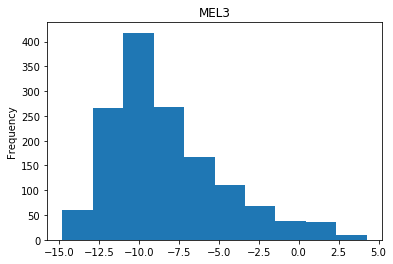

...

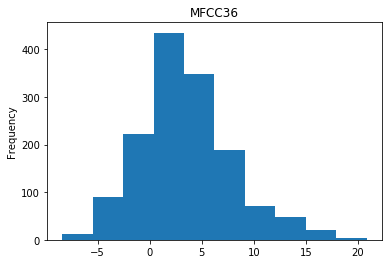

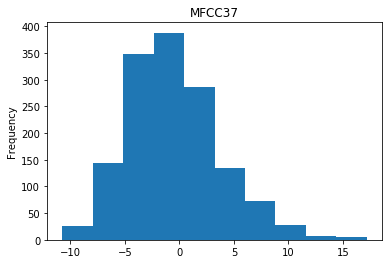

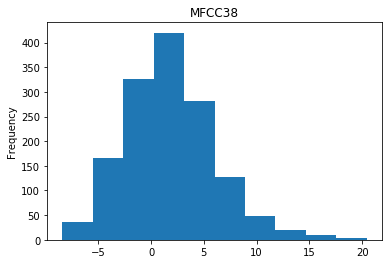

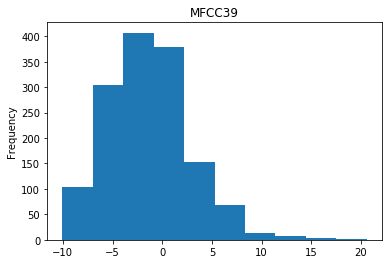

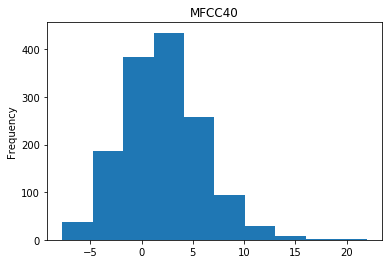

In [28]:
#Features that are not normal and require log transfromation 
# RMS, ZCR, MEL Features, BER

data['RMS'] = np.log(data['RMS'])
data['ZCR'] = np.log(data['ZCR'])
data[mel_cols] = np.log(data[mel_cols])
data['BER'] = np.log(data['BER'])

# Let's Visualize histogram of each feature after transformation
for col in data:
    data[col].plot(kind='hist')
    plt.title(col)
    plt.show()

In [29]:
# Scale the data and perform LDA for dimension reductionality
from sklearn.preprocessing import scale
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

scaled_data = pd.DataFrame(scale(data), columns=features)
lda = LinearDiscriminantAnalysis()
transformed_data = lda.fit_transform(scaled_data, final_df['Label'])

transformed_data.shape
pd.DataFrame(transformed_data)

,0,1,2,3,4,5,6
0,-2.104504,0.035697,-2.162800,2.302215,2.413713,-1.771408,-0.920424
1,-1.306384,-0.875455,-2.447477,2.449724,0.900992,-0.600460,-3.522553
2,-2.306099,0.426511,-3.509899,1.034877,2.539577,0.402989,-3.434673
3,-2.724010,-0.442053,-0.999916,1.595113,2.088131,-0.030373,-2.990780
4,-3.021452,0.815794,-0.938936,-0.051170,-1.234480,1.560098,0.693649
...,...,...,...,...,...,...,...
1435,0.619273,0.539635,-2.966631,1.799578,-2.262730,-3.598757,1.352387
1436,1.235648,3.086036,0.679820,2.993064,-0.545653,-2.416133,1.091698
1437,2.709281,1.501038,-0.624139,1.793406,-1.298175,-2.237490,0.604969
1438,3.017227,0.362912,1.730593,-0.364586,-1.329234,-2.119042,1.125134


In [30]:
# Split the test and train data into 70% and 30%
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(transformed_data,final_df['Emotion'],test_size=0.3,random_state=100, stratify=final_df['Label'])
print("Train Size: " , X_train.shape[0])
print('Test Size: ',X_test.shape[0])

Train Size:  1008
Test Size:  432


# Data Modelling
- Logistic Regression 
- Random Forest
- Naive Bayes
- Gradiant Boosting
- XGBoost

In [31]:
# Calculate score 
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.metrics import recall_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import precision_score
from sklearn.metrics import confusion_matrix

def get_scores(predicted, y_test):
#    cm = confusion_matrix(y_test,predicted, labels=['neutral','calm','happy','sad','angry','fearful','disgust','surprised'])
#    print(cm)
    print ("accuracy: ", str(accuracy_score(y_test, predicted)))
    print("F1_Score: ", str(f1_score(y_test, predicted, average='macro')))
    return

accuracy:  0.9537037037037037
F1_Score:  0.9545557862093017


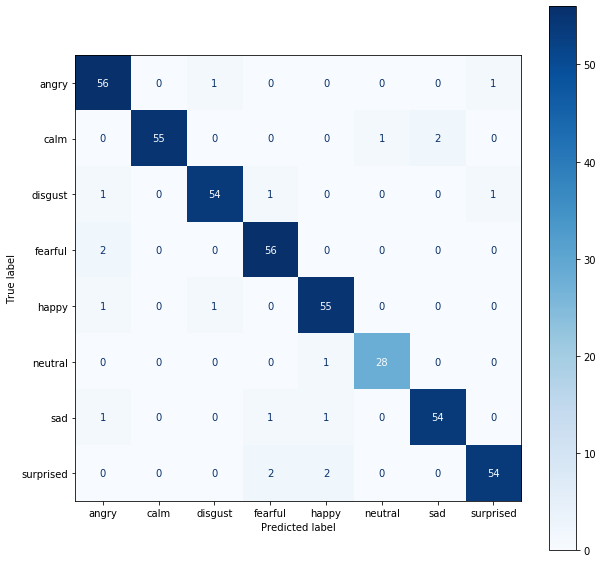

In [33]:
# Implement logistic Regression Model
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import plot_confusion_matrix


def logistic_regression(X_train, X_test, y_train, y_test):
    lr = LogisticRegression(random_state=1).fit(X_train,y_train)
    y_predicted = lr.predict(X_test)
    
    # Print model scores
    get_scores(y_predicted, y_test)
    
    #print confusion matrix
    fig, ax = plt.subplots(figsize=(10, 10))
    cm = plot_confusion_matrix(lr, X_test,y_test,cmap=plt.cm.Blues, ax=ax)

logistic_regression(X_train,X_test, y_train,y_test)

accuracy:  0.9166666666666666
F1_Score:  0.9146567849409749


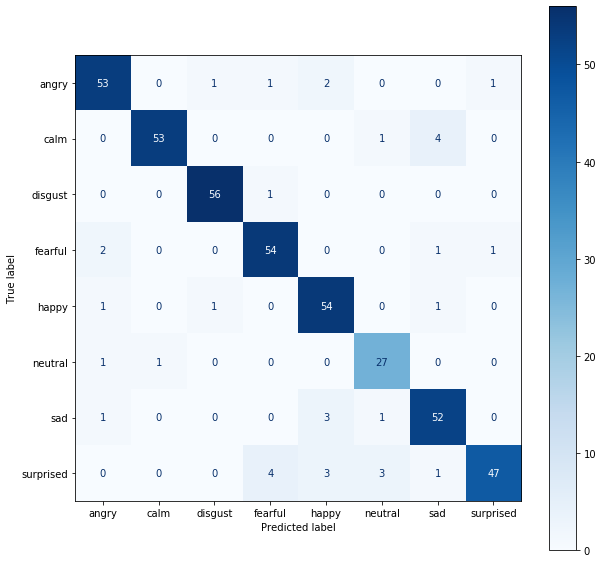

In [34]:
# Implement RandomForest Model
from sklearn.ensemble import RandomForestClassifier

def rf(X_train, X_test, y_train, y_test):
    rf = RandomForestClassifier(n_estimators=10,random_state=1).fit(X_train,y_train)
    y_predicted = rf.predict(X_test)

    # Print model scores
    get_scores(y_predicted, y_test)
    
    #print confusion matrix
    fig, ax = plt.subplots(figsize=(10, 10))
    cm = plot_confusion_matrix(rf, X_test,y_test,cmap=plt.cm.Blues, ax=ax)

rf(X_train,X_test, y_train,y_test)

accuracy:  0.9583333333333334
F1_Score:  0.958684113181761


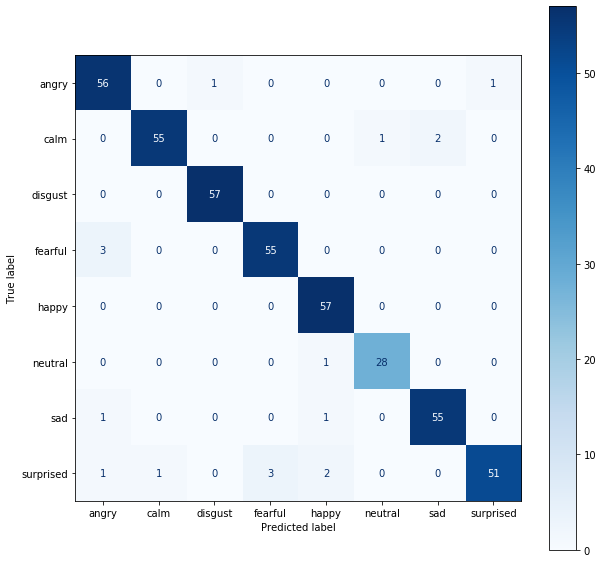

In [35]:
# Implement Naive Bayes
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import plot_confusion_matrix

def nb(X_train, X_test, y_train, y_test):
    nb = GaussianNB().fit(X_train,y_train)
    y_predicted = nb.predict(X_test)

    # Print model scores
    get_scores(y_predicted, y_test)
    
    #print confusion matrix
    fig, ax = plt.subplots(figsize=(10, 10))
    cm = plot_confusion_matrix(nb, X_test,y_test,cmap=plt.cm.Blues, ax=ax)
    
nb(X_train,X_test, y_train,y_test)

accuracy:  0.9189814814814815
F1_Score:  0.9185026713877236


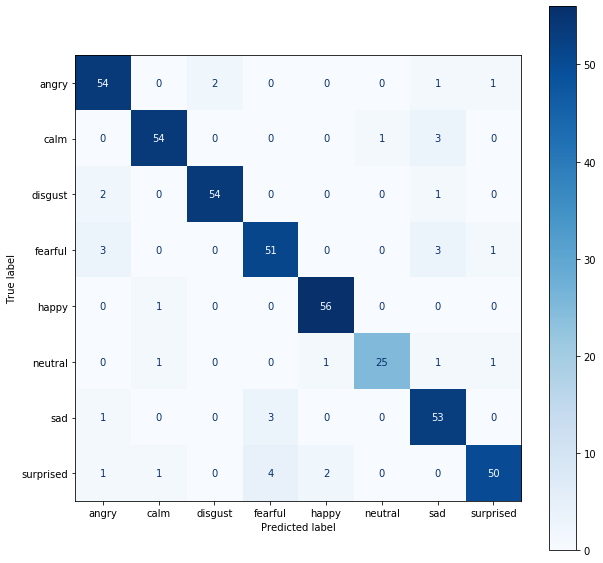

In [36]:
# Implement Gradient Boosting Classifier
from sklearn.ensemble import GradientBoostingClassifier

def gb(X_train, X_test, y_train, y_test):
    gb = GradientBoostingClassifier().fit(X_train,y_train)
    y_predicted = gb.predict(X_test)

    # Print model scores
    get_scores(y_predicted, y_test)
    
    #print confusion matrix
    fig, ax = plt.subplots(figsize=(10, 10))
    cm = plot_confusion_matrix(gb, X_test,y_test,cmap=plt.cm.Blues, ax=ax)
    
gb(X_train,X_test, y_train,y_test)

accuracy:  0.9351851851851852
F1_Score:  0.9360551385122138


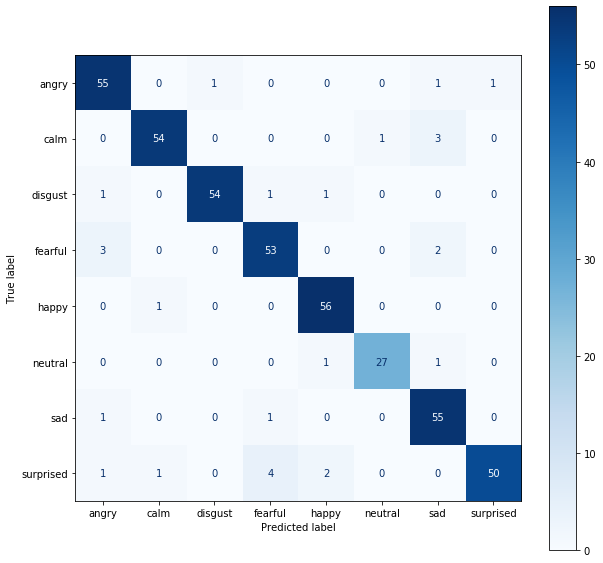

In [37]:
# Implement XGBoost Classifier
from xgboost.sklearn import XGBClassifier

def xgb(X_train, X_test, y_train, y_test):
    xgb = XGBClassifier().fit(X_train,y_train)
    y_predicted = xgb.predict(X_test)

    # Print model scores
    get_scores(y_predicted, y_test)
    
    #print confusion matrix
    fig, ax = plt.subplots(figsize=(10, 10))
    cm = plot_confusion_matrix(xgb, X_test,y_test,cmap=plt.cm.Blues, ax=ax)
    
xgb(X_train,X_test, y_train,y_test)